# Pump it Up: Data Mining the Water Table

In [ ]:
Link Competition: https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/

Can you predict which water pumps are faulty?

Using data from Taarifa and the Tanzanian Ministry of Water, can you predict which pumps are functional,
which need some repairs, and which don't work at all? This is an intermediate-level practice competition.
Predict one of these three classes based on a number of variables about what kind of pump is operating, 
when it was installed, and how it is managed. A smart understanding of which waterpoints will fail can
improve maintenance operations and ensure that clean, potable water is available to communities across Tanzania.

The labels in this dataset are simple. There are three possible values:

functional - the waterpoint is operational and there are no repairs needed
functional needs repair - the waterpoint is operational, but needs repairs
non functional - the waterpoint is not operational

In [1]:
#Librerias iniciales

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#Cargamos los dataset (archivos originales)
set_labels = pd.read_csv("C:\\Users\\realf\\OneDrive\\Documents\\CLASES MASTER\\Machine Learning\\Tarea\\Competition\\Training set labels.csv")
set_values = pd.read_csv("C:\\Users\\realf\\OneDrive\\Documents\\CLASES MASTER\\Machine Learning\\Tarea\\Competition\\Training set values.csv")

In [3]:
#Asignamos a las variables X,Y
X1=set_values.copy()
Y1=set_labels.copy()

In [4]:
#Ver como lucen los datos
Y1

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional
...,...,...
59395,60739,functional
59396,27263,functional
59397,37057,functional
59398,31282,functional


In [5]:
#Ver como lucen los datos
X1

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739,10.0,2013-05-03,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,0,...,per bucket,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
59396,27263,4700.0,2011-05-07,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Kwa Yahona Kuvala,0,...,annually,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe
59397,37057,0.0,2011-04-11,NaN,0,NaN,34.017087,-8.750434,Mashine,0,...,monthly,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump
59398,31282,0.0,2011-03-08,Malec,0,Musa,35.861315,-6.378573,Mshoro,0,...,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump


In [6]:
#Juntamos los datatos con la variable objetivo
dataset = pd.merge(X1, Y1, left_on='id', right_on='id')

In [7]:
dataset2 =  dataset.copy()
dataset3 =  dataset.copy()
dataset4 =  dataset.copy()

In [8]:
#Vision de los datos en conjunto
dataset

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739,10.0,2013-05-03,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
59396,27263,4700.0,2011-05-07,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Kwa Yahona Kuvala,0,...,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional
59397,37057,0.0,2011-04-11,NaN,0,NaN,34.017087,-8.750434,Mashine,0,...,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,functional
59398,31282,0.0,2011-03-08,Malec,0,Musa,35.861315,-6.378573,Mshoro,0,...,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional


In [9]:
#Vemos una estadistica general de las variables a estudiar
dataset.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000000,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,668.297239,34.077427,-5.706033e+00,0.474141,15.297003,5.629747,179.909983,1300.652475
std,21453.128371,2997.574558,693.116350,6.567432,2.946019e+00,12.236230,17.587406,9.633649,471.482176,951.620547
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18519.750000,0.000000,0.000000,33.090347,-8.540621e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37061.500000,0.000000,369.000000,34.908743,-5.021597e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,55656.500000,20.000000,1319.250000,37.178387,-3.326156e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


# Preprosesado de los datos

In [10]:
#Vemos el tipo de variables que tenemos
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55765 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

In [11]:
#Revision de nullos
dataset.isna().sum().sort_values()

id                           0
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
waterpoint_type_group        0
payment_type                 0
quality_group                0
quantity                     0
quantity_group               0
source                       0
source_type                  0
source_class                 0
waterpoint_type              0
water_quality                0
recorded_by                  0
status_group                 0
population                   0
amount_tsh                   0
date_recorded                0
gps_height                   0
longitude                    0
latitude                     0
wpt_name                     0
basin                        0
num_private                  0
region                       0
region_code                  0
district_code                0
lga     

In [12]:
#Imputamos missings
dataset['installer'].fillna("Desconocido", inplace=True)

In [13]:
#Elimino ID y 'date_recorded' para mi primer modelo
dataset = dataset.drop(['id'], axis=1)
dataset = dataset.drop(['date_recorded'], axis=1)

In [14]:
#En mi primer modelo elimino las variables con muchos missings
dataset = dataset.drop(['scheme_name'], axis=1)

In [15]:
#Eliminamos todos los demas missings 
#dataset = dataset.dropna()
dataset.fillna("Desconocido", inplace=True)

In [16]:
#Configuramos los formatos de algunas variables ya que se encuentran como boolean
dataset['permit'] = dataset['permit'].astype(str)
dataset['public_meeting'] = dataset['public_meeting'].astype(str)

In [17]:
#Volvemos a revisar los nulos y vemos que ya no tenemos missings
dataset.isna().sum().sort_values()

amount_tsh               0
extraction_type          0
extraction_type_group    0
extraction_type_class    0
management               0
management_group         0
payment                  0
payment_type             0
water_quality            0
quality_group            0
quantity                 0
quantity_group           0
source                   0
source_type              0
source_class             0
waterpoint_type          0
construction_year        0
permit                   0
scheme_management        0
recorded_by              0
funder                   0
gps_height               0
installer                0
longitude                0
latitude                 0
wpt_name                 0
num_private              0
waterpoint_type_group    0
basin                    0
region                   0
region_code              0
district_code            0
lga                      0
ward                     0
population               0
public_meeting           0
subvillage               0
s

In [18]:
#Los nuevos datos
dataset

,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,6000.0,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,0.0,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,25.0,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,0.0,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,0.0,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.0,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,0,Pangani,Kiduruni,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
59396,4700.0,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Kwa Yahona Kuvala,0,Rufiji,Igumbilo,...,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional
59397,0.0,Desconocido,0,Desconocido,34.017087,-8.750434,Mashine,0,Rufiji,Madungulu,...,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,functional
59398,0.0,Malec,0,Musa,35.861315,-6.378573,Mshoro,0,Rufiji,Mwinyi,...,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional


In [19]:
#Convertimos la variable objetivo a numerica

valores_status = {'status_group':{'functional':0, 'functional needs repair': 1, 'non functional':2}}
dataset.replace(valores_status, inplace=True)
valores_status

{'status_group': {'functional': 0,
  'functional needs repair': 1,
  'non functional': 2}}

In [20]:
#Trabformacion a numerica de las demas variables categoricas

from sklearn import preprocessing 
from sklearn.preprocessing import LabelEncoder

# Seleccionamos las variables categóricas
cat_cols = dataset.select_dtypes(include=['object']).columns

# Aplicamos LabelEncoder a cada variable categórica
le = LabelEncoder()
for col in cat_cols:
    dataset[col] = le.fit_transform(dataset[col])

In [21]:
#Verificamos que las se hayan codificado correctamente
dataset

,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,6000.0,1370,1390,1519,34.938093,-9.856322,37399,0,1,11808,...,6,2,1,1,8,6,0,1,1,0
1,0.0,470,1399,546,34.698766,-2.147466,37195,0,4,15839,...,6,2,2,2,5,3,1,1,1,0
2,25.0,826,686,2049,37.460664,-3.821329,14572,0,5,9075,...,6,2,1,1,0,1,1,2,1,0
3,0.0,1742,263,1853,38.486161,-11.155298,37285,0,7,8983,...,6,2,0,0,3,0,0,2,1,2
4,0.0,20,0,119,31.130847,-1.825359,35529,0,4,7699,...,6,2,3,3,5,3,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.0,437,1210,201,37.169807,-3.253847,513,0,5,5682,...,6,2,1,1,8,6,0,1,1,0
59396,4700.0,177,1212,265,35.249991,-9.070629,24074,0,6,2981,...,6,2,1,1,6,4,1,1,1,0
59397,0.0,286,0,411,34.017087,-8.750434,27926,0,6,8785,...,1,1,1,1,3,0,0,4,3,0
59398,0.0,885,0,1214,35.861315,-6.378573,29693,0,6,14013,...,6,2,2,2,7,5,0,4,3,0


In [22]:
X= dataset.drop('status_group',axis=1)
y= dataset.status_group

# Particion Training Test

In [23]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.3,
                                                    random_state=42)

Implemente 3 modelos: DecisionTreeClassifier, XGBClassifier y RandomForestClassifier obteniendo el mejor score con RandomForestClassifier

In [24]:
#DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier

model_DT = DecisionTreeClassifier()
model_DT = model_DT.fit(X_train,y_train)
prediccion_DT1 = model_DT.predict(X_test)

In [25]:
prediccion_DT1

array([2, 0, 0, ..., 0, 0, 0], dtype=int64)

In [36]:
from pandas.plotting import scatter_matrix
from sklearn.metrics import accuracy_score, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve
from sklearn.metrics import classification_report

def saca_metricas(y1, y2):
    print('matriz de confusión')
    print(confusion_matrix(y1, y2))
    print('accuracy')
    print(accuracy_score(y1, y2))
    print('precision')
    print(precision_score(y1, y2, average='weighted'))
    print('recall')
    print(recall_score(y1, y2, average='weighted'))
    print('f1')
    print(f1_score(y1, y2, average='weighted'))

In [27]:
saca_metricas(y_test, prediccion_DT1)

matriz de confusión
[[7677  636 1411]
 [ 570  462  261]
 [1365  285 5153]]
accuracy
0.7459034792368125
precision
0.7483040238309926
recall
0.7459034792368125
f1
0.7470600895837551


In [28]:
#XGBClassifier

from numpy import loadtxt
from xgboost import XGBClassifier

model_XGB = XGBClassifier()
model_XGB = model_XGB.fit(X_train,y_train)
prediccion_XGB1 = model_XGB.predict(X_test)

In [29]:
saca_metricas(y_test, prediccion_XGB1)

matriz de confusión
[[8818  132  774]
 [ 753  354  186]
 [1687   60 5056]]
accuracy
0.7984287317620651
precision
0.7952976827483405
recall
0.7984287317620651
f1
0.787739180921631


In [30]:
# RandomForestClassifier

from sklearn.ensemble import RandomForestClassifier

model_RF = RandomForestClassifier(random_state=42)
model_RF = model_RF.fit(X_train,y_train)
prediccion_RF1 = model_RF.predict(X_test)

In [31]:
saca_metricas(y_test, prediccion_RF1)

matriz de confusión
[[8669  241  814]
 [ 673  440  180]
 [1381  127 5295]]
accuracy
0.8083052749719416
precision
0.8020891474318179
recall
0.8083052749719416
f1
0.8019026624906763


#Comparando estos 3 modelos el mejor score es el RandomForestClassifier con lo que me enfocare en el 

# Submission Test

In [33]:
#set_val = pd.read_csv("C:\\Users\\realf\\OneDrive\\Documents\\CLASES MASTER\\Machine Learning\\Tarea\\Competition\\Test set values.csv")


In [34]:
#Preprosedado de los datos de validacion

#(archivo original)
set_val = pd.read_csv("C:\\Users\\realf\\OneDrive\\Documents\\CLASES MASTER\\Machine Learning\\Tarea\\Competition\\Test set values.csv")
set_val


set_val_id = set_val['id']
set_val_id.to_csv('set_val_id.csv', index=False)


#Imputamos missings
set_val['installer'].fillna("Desconocido", inplace=True)
set_val = set_val.drop(['date_recorded'], axis=1)
set_val = set_val.drop(['scheme_name'], axis=1)
#Eliminamos todos los demas missings 
dataset.fillna("Desconocido", inplace=True)


#Trabformacion a numerica de las demas variables categoricas
from sklearn import preprocessing 
from sklearn.preprocessing import LabelEncoder


# Seleccionamos las variables categóricas
cat_cols_val1 = set_val.select_dtypes(include=['object']).columns

# Aplicamos LabelEncoder a cada variable categórica
le = LabelEncoder()
for col in cat_cols_val1:
    set_val[col] = le.fit_transform(set_val[col])

In [35]:
#set_val_id = set_val['id']

#df_id = pd.read_csv("C:\\Users\\realf\\OneDrive\\Documents\\CLASES MASTER\\Machine Learning\\Investigation\\set_val_id.csv")

In [36]:
val_test1 = set_val.drop(['id'], axis=1)

In [37]:
val_test1

,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,0.0,175,1996,214,35.290799,-4.059696,656,0,0,3916,...,2,6,2,3,3,5,3,1,6,5
1,0.0,250,1569,221,36.656709,-3.309214,1780,0,5,2717,...,2,6,2,2,2,8,6,0,1,1
2,0.0,980,1567,229,34.767863,-5.004344,9673,0,0,5398,...,2,6,2,2,2,5,3,1,6,5
3,0.0,222,267,263,38.058046,-9.418672,5595,0,7,2795,...,6,6,2,0,0,7,5,0,6,5
4,500.0,73,1260,75,35.006123,-10.950412,5706,0,7,3544,...,1,6,2,1,1,8,6,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14845,0.0,145,34,226,38.852669,-6.582841,7223,0,8,8402,...,2,6,2,1,1,6,4,1,1,1
14846,1000.0,286,0,320,37.451633,-5.350428,332,0,5,5028,...,0,4,4,2,2,7,5,0,4,3
14847,0.0,980,1476,229,34.739804,-4.585587,457,0,0,1833,...,2,6,2,2,2,0,1,1,1,1
14848,0.0,242,998,221,35.432732,-10.584159,3438,0,1,6246,...,2,6,2,2,2,6,4,1,1,1


In [38]:
#Guarde el ID en una variable para juntarlo con las predicciones posteriormente

df_id = pd.read_csv("C:\\Users\\realf\\OneDrive\\Documents\\CLASES MASTER\\Machine Learning\\Investigation\\set_val_id.csv")

In [39]:
###############################################DecisionTreeClassifier##################################################

In [40]:
#Realizamos la predicion
prediccion_DT2 = model_DT.predict(val_test1)

In [41]:
#Se generan estas predicciones
prediccion_DT2

array([2, 0, 0, ..., 2, 0, 2], dtype=int64)

In [42]:
#Lo guardamos en un dataframe
prediccion_DT2_df = pd.DataFrame(prediccion_DT2)

In [43]:
prediccion_DT2_df.columns=['status_group']

In [44]:
prediccion_DT2_df

,status_group
0,2
1,0
2,0
3,2
4,0
...,...
14845,2
14846,0
14847,2
14848,0


In [45]:
#Unimos el id con las predicciones
SubmissionFormat1 = pd.concat([df_id, prediccion_DT2_df], axis=1)

In [46]:
#Remplazamos su equivalencia de la prediccion donde 0:'functional, 1:'functional needs repair, 2:'non functional'
status_original = {'status_group':{0:'functional', 1:'functional needs repair', 2:'non functional'}}
SubmissionFormat1.replace(status_original, inplace=True)
status_original

{'status_group': {0: 'functional',
  1: 'functional needs repair',
  2: 'non functional'}}

In [47]:
SubmissionFormat1.style.hide_index()

C:\Users\realf\AppData\Local\Temp\ipykernel_27856\2117546566.py:1: FutureWarning: this method is deprecated in favour of `Styler.hide(axis='index')`
  SubmissionFormat1.style.hide_index()


id,status_group
50785,non functional
51630,functional
17168,functional
45559,non functional
49871,functional
52449,functional
24806,functional
28965,non functional
36301,non functional
54122,functional


In [48]:
#Con este codigo generamos el archivo para subirlo a la plataforma
SubmissionFormat1.to_csv('SubmissionFormat1.csv', index=False)

In [49]:
###############################################XGBClassifier######################################################

In [50]:
#Hacemos la prediccion
prediccion_XGB2 = model_XGB.predict(val_test1)

In [51]:
prediccion_XGB2

array([2, 0, 0, ..., 0, 0, 2], dtype=int64)

In [52]:
#Lo guardamos en un data frame
prediccion_XGB1_df = pd.DataFrame(prediccion_XGB2)

In [53]:
prediccion_XGB1_df.columns=['status_group']

In [54]:
prediccion_XGB1_df

,status_group
0,2
1,0
2,0
3,2
4,0
...,...
14845,2
14846,0
14847,0
14848,0


In [55]:
#Unimos la prediccion con su id
SubmissionFormat2 = pd.concat([df_id, prediccion_XGB1_df], axis=1)

In [56]:
#Remplazamos su equivalencia de la prediccion donde 0:'functional, 1:'functional needs repair, 2:'non functional'
status_original = {'status_group':{0:'functional', 1:'functional needs repair', 2:'non functional'}}
SubmissionFormat2.replace(status_original, inplace=True)
status_original

{'status_group': {0: 'functional',
  1: 'functional needs repair',
  2: 'non functional'}}

In [57]:
SubmissionFormat2.style.hide_index()

C:\Users\realf\AppData\Local\Temp\ipykernel_27856\2797302754.py:1: FutureWarning: this method is deprecated in favour of `Styler.hide(axis='index')`
  SubmissionFormat2.style.hide_index()


id,status_group
50785,non functional
51630,functional
17168,functional
45559,non functional
49871,functional
52449,functional
24806,functional
28965,non functional
36301,non functional
54122,functional


In [58]:
#Guardamos la prediccion para subirlo a la pagina
SubmissionFormat.to_csv('SubmissionFormat.csv', index=False)

In [59]:
####################################### RandomForestClassifier #####################################################

In [60]:
#Hacemos la prediccion
prediccion_RF2 = model_RF.predict(val_test1)

In [61]:
prediccion_RF2

array([0, 0, 0, ..., 0, 0, 2], dtype=int64)

In [62]:
#Guardamos la prediccion como dataframe
prediccion_RF2_df = pd.DataFrame(prediccion_RF2)

In [63]:
prediccion_RF2_df.columns=['status_group']

In [64]:
prediccion_RF2_df

,status_group
0,0
1,0
2,0
3,2
4,0
...,...
14845,2
14846,0
14847,0
14848,0


In [65]:
#Unimos la prediccion con su id
SubmissionFormat3 = pd.concat([df_id, prediccion_RF2_df], axis=1)

In [66]:
#Remplazamos su equivalencia de la prediccion donde 0:'functional, 1:'functional needs repair, 2:'non functional'
status_original = {'status_group':{0:'functional', 1:'functional needs repair', 2:'non functional'}}
SubmissionFormat3.replace(status_original, inplace=True)
status_original

{'status_group': {0: 'functional',
  1: 'functional needs repair',
  2: 'non functional'}}

In [67]:
SubmissionFormat3.style.hide_index()

C:\Users\realf\AppData\Local\Temp\ipykernel_27856\4107078705.py:1: FutureWarning: this method is deprecated in favour of `Styler.hide(axis='index')`
  SubmissionFormat3.style.hide_index()


id,status_group
50785,functional
51630,functional
17168,functional
45559,non functional
49871,functional
52449,functional
24806,functional
28965,non functional
36301,non functional
54122,functional


In [68]:
#Guardamos la prediccion para subirlo a la pagina
SubmissionFormat3.to_csv('SubmissionFormat3.csv', index=False)

# Cambiar cosas en el preprocesado

Decidi hacer unos cambios en el preprocesado donde no elimino todos los missing sino los reemplazo por 'desconocido',
incluyo la variable date_recorded que contenia un formato fecha, trabajo los outliers

In [9]:
#En lugar de eliminar la mayoria de los missings los reemplazaremos con un 'Desconocido' y solo eliminamos una con demasiados missings
dataset2 = dataset2.drop(['scheme_name'], axis=1)
dataset2 = dataset2.drop(['id'], axis=1)

In [10]:
dataset2.fillna("Desconocido", inplace=True)

In [11]:
#Configuramos los formatos de algunas variables ya que se encuentran como boolean
dataset2['permit'] = dataset2['permit'].astype(str)
dataset2['public_meeting'] = dataset2['public_meeting'].astype(str)

In [12]:
#Cambiamos el formato de la variable que contiene fechas
dataset2['date_recorded'] = pd.to_datetime(dataset2['date_recorded'], format='%Y-%m-%d').dt.strftime('%d-%m-%Y')

In [13]:
#Revision de nullos y vemos que ya no tenemos missings
dataset2.isna().sum().sort_values()

amount_tsh               0
construction_year        0
extraction_type          0
extraction_type_group    0
extraction_type_class    0
management               0
management_group         0
payment                  0
permit                   0
payment_type             0
quality_group            0
quantity                 0
quantity_group           0
source                   0
source_type              0
source_class             0
waterpoint_type          0
water_quality            0
waterpoint_type_group    0
scheme_management        0
public_meeting           0
date_recorded            0
funder                   0
gps_height               0
installer                0
longitude                0
latitude                 0
wpt_name                 0
recorded_by              0
num_private              0
subvillage               0
region                   0
region_code              0
district_code            0
lga                      0
ward                     0
population               0
b

In [14]:
#Asi luce el nuevo dataset
dataset2

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,6000.0,14-03-2011,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,0.0,06-03-2013,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,25.0,25-02-2013,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,0.0,28-01-2013,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,0.0,13-07-2011,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.0,03-05-2013,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,0,Pangani,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
59396,4700.0,07-05-2011,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Kwa Yahona Kuvala,0,Rufiji,...,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional
59397,0.0,11-04-2011,Desconocido,0,Desconocido,34.017087,-8.750434,Mashine,0,Rufiji,...,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,functional
59398,0.0,08-03-2011,Malec,0,Musa,35.861315,-6.378573,Mshoro,0,Rufiji,...,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional


In [15]:
#Convertimos la variable objetivo a numerica
valores_status = {'status_group':{'functional':0, 'functional needs repair': 1, 'non functional':2}}
dataset2.replace(valores_status, inplace=True)
valores_status

{'status_group': {'functional': 0,
  'functional needs repair': 1,
  'non functional': 2}}

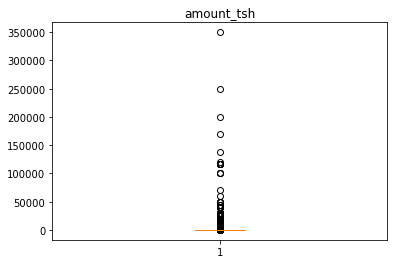

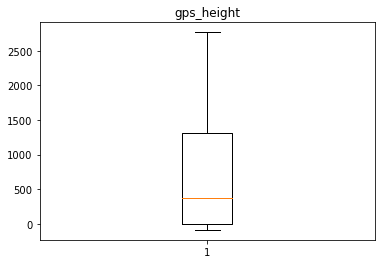

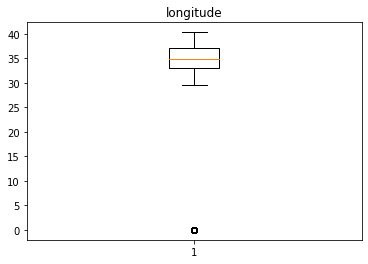

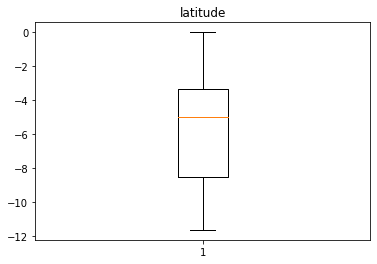

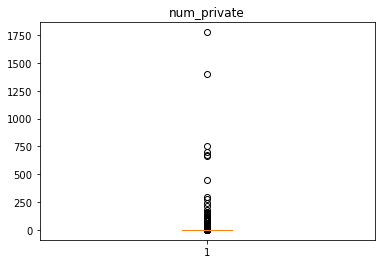

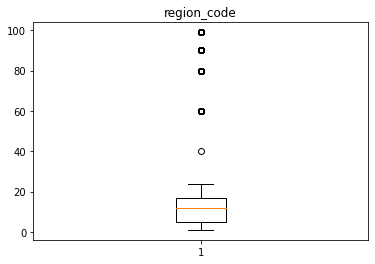

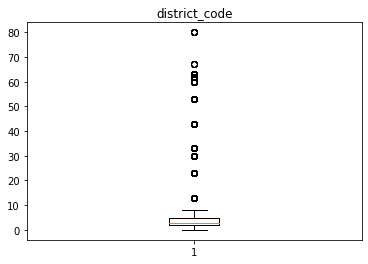

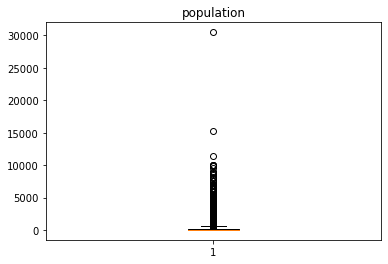

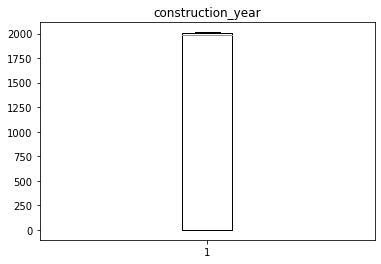

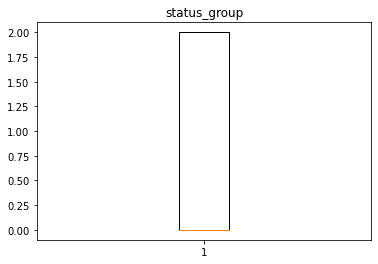

In [16]:
#Vemos los posibles outliers
numeric_cols_1 = dataset2.select_dtypes(include=['int', 'float']).columns

for column in numeric_cols_1:
    plt.figure()
    plt.boxplot(dataset2[column])
    plt.title(column)
    plt.show()
    

In [17]:
#En su lugar modificare los outliers a con los limites superior a inferior

In [18]:
variables = ['amount_tsh', 'gps_height', 'longitude', 'population']
dataset2_variables = dataset2[variables]

#Calcular el rango intercuartílico (IQR) de cada variable:
Q1 = dataset2_variables.quantile(0.25)
Q3 = dataset2_variables.quantile(0.75)
IQR = Q3 - Q1

#Definir los límites para identificar los outliers:
lim_inf = Q1 - 1.5 * IQR
lim_sup = Q3 + 1.5 * IQR

# Reemplazar los valores outliers con el límite inferior o superior correspondiente
dataset2_variables = dataset2_variables.clip(lower=lim_inf, upper=lim_sup, axis=1)

# Agregar las variables corregidas al dataframe original
dataset2[variables] = dataset2_variables

In [19]:
#Variables en las que se trabajaron outliers
dataset2[variables]

,amount_tsh,gps_height,longitude,population
0,50.0,1390,34.938093,109.0
1,0.0,1399,34.698766,280.0
2,25.0,686,37.460664,250.0
3,0.0,263,38.486161,58.0
4,0.0,0,31.130847,0.0
...,...,...,...,...
59395,10.0,1210,37.169807,125.0
59396,50.0,1212,35.249991,56.0
59397,0.0,0,34.017087,0.0
59398,0.0,0,35.861315,0.0


In [20]:
dataset2

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,50.0,14-03-2011,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,0
1,0.0,06-03-2013,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,0
2,25.0,25-02-2013,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,0
3,0.0,28-01-2013,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,2
4,0.0,13-07-2011,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.0,03-05-2013,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,0,Pangani,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,0
59396,50.0,07-05-2011,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Kwa Yahona Kuvala,0,Rufiji,...,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,0
59397,0.0,11-04-2011,Desconocido,0,Desconocido,34.017087,-8.750434,Mashine,0,Rufiji,...,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,0
59398,0.0,08-03-2011,Malec,0,Musa,35.861315,-6.378573,Mshoro,0,Rufiji,...,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,0


In [21]:
#Trabformacion a numerica de las demas variables categoricas

from sklearn import preprocessing 
from sklearn.preprocessing import LabelEncoder

# Seleccionamos las variables categóricas
cat_cols_val2 = dataset2.select_dtypes(include=['object']).columns

# Aplicamos LabelEncoder a cada variable categórica
le = LabelEncoder()
for col in cat_cols_val2:
    dataset2[col] = le.fit_transform(dataset2[col])

In [22]:
#Verificamos que se hayan codificado correctamente
dataset2

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,50.0,184,1370,1390,1519,34.938093,-9.856322,37399,0,1,...,6,2,1,1,8,6,0,1,1,0
1,0.0,95,470,1399,546,34.698766,-2.147466,37195,0,4,...,6,2,2,2,5,3,1,1,1,0
2,25.0,304,826,686,2049,37.460664,-3.821329,14572,0,5,...,6,2,1,1,0,1,1,2,1,0
3,0.0,329,1742,263,1853,38.486161,-11.155298,37285,0,7,...,6,2,0,0,3,0,0,2,1,2
4,0.0,175,20,0,119,31.130847,-1.825359,35529,0,4,...,6,2,3,3,5,3,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,10.0,44,437,1210,201,37.169807,-3.253847,513,0,5,...,6,2,1,1,8,6,0,1,1,0
59396,50.0,108,177,1212,265,35.249991,-9.070629,24074,0,6,...,6,2,1,1,6,4,1,1,1,0
59397,0.0,152,286,0,411,34.017087,-8.750434,27926,0,6,...,1,1,1,1,3,0,0,4,3,0
59398,0.0,120,885,0,1214,35.861315,-6.378573,29693,0,6,...,6,2,2,2,7,5,0,4,3,0


In [23]:
X2= dataset2.drop('status_group',axis=1)
y2= dataset2.status_group

In [86]:
#Intente Estandarizar los datos pero la diferencia era mimina por lo que decidi conservar los valores otiginales 
#X2= df.drop('status_group',axis=1)
#y2= df.status_group

# Como el mejor score lo obtuve con Random Forest seguire por ese camino

# Particion Training Test

In [87]:
#Como el mejor score lo obtuve con Random Forest seguire por ese camino

In [88]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X2,
                                                    y2,
                                                    test_size=0.3,
                                                    random_state=42)

In [89]:
from sklearn.ensemble import RandomForestClassifier

model_RF3 = RandomForestClassifier(random_state=42)
model_RF3 = model_RF3.fit(X_train,y_train)
prediccion_RF3 = model_RF3.predict(X_test)

In [90]:
saca_metricas(y_test, prediccion_RF3)

matriz de confusión
[[8654  251  819]
 [ 658  451  184]
 [1390  126 5287]]
accuracy
0.807631874298541
precision
0.8016628691584453
recall
0.807631874298541
f1
0.8015528571485885


In [91]:
#Obtenemos un accuracy de 0.80

# Submission Test

In [40]:
#Datos de Validacion (originales)
set_val_1 = pd.read_csv("C:\\Users\\realf\\OneDrive\\Documents\\CLASES MASTER\\Machine Learning\\Tarea\\Competition\\Test set values.csv")

In [41]:
#Preprocesado de los datos de validacion 

df_id = set_val_1['id']


#En lugar de eliminar la mayoria de los missings los reemplazaremos con un 'Desconocido' y solo eliminamos una con demasiados missings
set_val_1 = set_val_1.drop(['scheme_name'], axis=1)
set_val_1 = set_val_1.drop(['id'], axis=1)
set_val_1.fillna("Desconocido", inplace=True)

#Configuramos los formatos de algunas variables ya que se encuentran como boolean
set_val_1['permit'] = set_val_1['permit'].astype(str)
set_val_1['public_meeting'] = set_val_1['public_meeting'].astype(str)

#Para utilizar la variable que contiene fecha le Cambiamos el formato para poder trabajar con ella
set_val_1['date_recorded'] = pd.to_datetime(set_val_1['date_recorded'], format='%Y-%m-%d').dt.strftime('%d-%m-%Y')

#Convertimos la variable objetivo a numerica
valores_status = {'status_group':{'functional':0, 'functional needs repair': 1, 'non functional':2}}
set_val_1.replace(valores_status, inplace=True)
valores_status

#Trabajamos outliers
variables = ['amount_tsh', 'gps_height', 'longitude', 'population']
set_val_1_variables = set_val_1[variables]

#Calcular el rango intercuartílico (IQR) de cada variable:
Q1 = set_val_1_variables.quantile(0.25)
Q3 = set_val_1_variables.quantile(0.75)
IQR = Q3 - Q1

#Definir los límites para identificar los outliers:
lim_inf = Q1 - 1.5 * IQR
lim_sup = Q3 + 1.5 * IQR

# Reemplazar los valores outliers con el límite inferior o superior correspondiente
set_val_1_variables = set_val_1_variables.clip(lower=lim_inf, upper=lim_sup, axis=1)

# Agregar las variables corregidas al dataframe original
set_val_1[variables] = set_val_1_variables

#Trabformacion a numerica de las demas variables categoricas

from sklearn import preprocessing 
from sklearn.preprocessing import LabelEncoder

# Seleccionamos las variables categóricas
cat_cols_3 = set_val_1.select_dtypes(include=['object']).columns

# Aplicamos LabelEncoder a cada variable categórica
le = LabelEncoder()
for col in cat_cols_3:
    set_val_1[col] = le.fit_transform(set_val_1[col])
    
set_val_1

C:\Users\realf\AppData\Local\Temp\ipykernel_33236\2771578286.py:37: FutureWarning: Downcasting integer-dtype results in .where is deprecated and will change in a future version. To retain the old behavior, explicitly cast the results to the desired dtype.
  set_val_1_variables = set_val_1_variables.clip(lower=lim_inf, upper=lim_sup, axis=1)


,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,0.0,61,176,1996,214,35.290799,-4.059696,656,0,0,...,2,6,2,3,3,5,3,1,6,5
1,0.0,61,251,1569,221,36.656709,-3.309214,1780,0,5,...,2,6,2,2,2,8,6,0,1,1
2,0.0,2,161,1567,229,34.767863,-5.004344,9673,0,0,...,2,6,2,2,2,5,3,1,6,5
3,0.0,251,223,267,263,38.058046,-9.418672,5595,0,7,...,6,6,2,0,0,7,5,0,6,5
4,62.5,303,73,1260,75,35.006123,-10.950412,5706,0,7,...,1,6,2,1,1,8,6,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14845,0.0,273,145,34,226,38.852669,-6.582841,7223,0,8,...,2,6,2,1,1,6,4,1,1,1
14846,62.5,245,287,0,320,37.451633,-5.350428,332,0,5,...,0,4,4,2,2,7,5,0,4,3
14847,0.0,63,161,1476,229,34.739804,-4.585587,457,0,0,...,2,6,2,2,2,0,1,1,1,1
14848,0.0,215,243,998,221,35.432732,-10.584159,3438,0,1,...,2,6,2,2,2,6,4,1,1,1


In [112]:
val_test_2 = set_val_1.copy()

In [113]:
val_test_2

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,0.0,61,176,1996,214,35.290799,-4.059696,656,0,0,...,2,6,2,3,3,5,3,1,6,5
1,0.0,61,251,1569,221,36.656709,-3.309214,1780,0,5,...,2,6,2,2,2,8,6,0,1,1
2,0.0,2,161,1567,229,34.767863,-5.004344,9673,0,0,...,2,6,2,2,2,5,3,1,6,5
3,0.0,251,223,267,263,38.058046,-9.418672,5595,0,7,...,6,6,2,0,0,7,5,0,6,5
4,62.5,303,73,1260,75,35.006123,-10.950412,5706,0,7,...,1,6,2,1,1,8,6,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14845,0.0,273,145,34,226,38.852669,-6.582841,7223,0,8,...,2,6,2,1,1,6,4,1,1,1
14846,62.5,245,287,0,320,37.451633,-5.350428,332,0,5,...,0,4,4,2,2,7,5,0,4,3
14847,0.0,63,161,1476,229,34.739804,-4.585587,457,0,0,...,2,6,2,2,2,0,1,1,1,1
14848,0.0,215,243,998,221,35.432732,-10.584159,3438,0,1,...,2,6,2,2,2,6,4,1,1,1


In [115]:
#Realizamos la prediccion
prediccion_RF4 = model_RF3.predict(val_test_2)

In [116]:
prediccion_RF4

array([2, 0, 0, ..., 0, 0, 2], dtype=int64)

In [117]:
#Guardamos la prediccion en un dataframe
prediccion_RF4_df = pd.DataFrame(prediccion_RF2)

In [118]:
prediccion_RF4_df.columns=['status_group']

In [119]:
prediccion_RF4_df

,status_group
0,0
1,0
2,0
3,2
4,0
...,...
14845,2
14846,0
14847,0
14848,0


In [121]:
#Unimos la prediccion con el id
SubmissionFormat4 = pd.concat([df_id, prediccion_RF4_df], axis=1)

In [122]:
#Remplazamos su equivalencia de la prediccion donde 0:'functional, 1:'functional needs repair, 2:'non functional'
status_original = {'status_group':{0:'functional', 1:'functional needs repair', 2:'non functional'}}
SubmissionFormat4.replace(status_original, inplace=True)
status_original

{'status_group': {0: 'functional',
  1: 'functional needs repair',
  2: 'non functional'}}

In [123]:
SubmissionFormat4.style.hide_index()

C:\Users\realf\AppData\Local\Temp\ipykernel_121172\4135045293.py:1: FutureWarning: this method is deprecated in favour of `Styler.hide(axis='index')`
  SubmissionFormat4.style.hide_index()


id,status_group
50785,functional
51630,functional
17168,functional
45559,non functional
49871,functional
52449,functional
24806,functional
28965,non functional
36301,non functional
54122,functional


In [124]:
#Guardamos la prediccion para subirlo a la pagina
SubmissionFormat4.to_csv('SubmissionFormat4.csv', index=False)

In [125]:
#Intenraremos seleccionar las variables con feature_importances

# Obtener la importancia de cada variable
importances = model_RF3.feature_importances_

# Obtener el índice de importancia de las variables en orden descendente
indices = np.argsort(importances)[::-1]

# Crear una lista de nombres de variables ordenados por importancia
variables_importantes = [X_train.columns[i] for i in indices]

# Imprimir las variables importantes y su importancia
print("Variables de mayor importancia:")
for i in range(X_train.shape[1]):
    print("%d. %s (%f)" % (i+1, variables_importantes[i], importances[indices[i]]))
    

Variables de mayor importancia:
1. longitude (0.082602)
2. latitude (0.079872)
3. quantity_group (0.073129)
4. quantity (0.063096)
5. wpt_name (0.059637)
6. subvillage (0.055018)
7. gps_height (0.045478)
8. date_recorded (0.042245)
9. ward (0.037432)
10. construction_year (0.036441)
11. waterpoint_type (0.034235)
12. waterpoint_type_group (0.033117)
13. funder (0.032014)
14. population (0.029151)
15. installer (0.025598)
16. lga (0.024423)
17. extraction_type (0.018254)
18. extraction_type_class (0.017930)
19. payment (0.016023)
20. extraction_type_group (0.015962)
21. district_code (0.015181)
22. region (0.014970)
23. amount_tsh (0.014640)
24. payment_type (0.014403)
25. region_code (0.014180)
26. management (0.013860)
27. source (0.013711)
28. scheme_management (0.012362)
29. basin (0.012209)
30. source_type (0.011076)
31. water_quality (0.009335)
32. quality_group (0.007470)
33. permit (0.007008)
34. public_meeting (0.006481)
35. management_group (0.005761)
36. source_class (0.00456

In [126]:
# Seleccionar las variables con una importancia mayor a 0.0149
variables_seleccionadas = [var for var in variables_importantes if importances[indices[variables_importantes.index(var)]] > 0.0149]

print("\nVariables seleccionadas:")
print(variables_seleccionadas)


Variables seleccionadas:
['longitude', 'latitude', 'quantity_group', 'quantity', 'wpt_name', 'subvillage', 'gps_height', 'date_recorded', 'ward', 'construction_year', 'waterpoint_type', 'waterpoint_type_group', 'funder', 'population', 'installer', 'lga', 'extraction_type', 'extraction_type_class', 'payment', 'extraction_type_group', 'district_code', 'region']


In [127]:
# Seleccionar únicamente las variables importantes del conjunto de entrenamiento y de prueba
X_train_imp = X_train[variables_seleccionadas]
X_test_imp = X_test[variables_seleccionadas]


# Volver a entrenar el modelo de Random Forest con las variables importantes
model_RF_imp = RandomForestClassifier(n_estimators=100, random_state=42)
model_RF_imp.fit(X_train_imp, y_train)

# Predecir los valores de prueba
prediccion_RF_imp = model_RF_imp.predict(X_test_imp)

# Calcular la precisión del modelo
precision_RF_imp = accuracy_score(y_test, prediccion_RF_imp)
print("Precisión del modelo con variables importantes: {:.2f}%".format(precision_RF_imp * 100))

Precisión del modelo con variables importantes: 80.59%


# Submission Test

In [128]:
#Las variables con mayor importancia
variables_seleccionadas = ['longitude', 'latitude', 'quantity_group', 'quantity', 'wpt_name', 'subvillage', 'gps_height', 'date_recorded', 'ward', 'construction_year', 'waterpoint_type', 'waterpoint_type_group', 'funder', 'population', 'installer', 'lga', 'extraction_type', 'extraction_type_class', 'payment', 'extraction_type_group', 'district_code', 'region']

In [129]:
# Seleccionar únicamente las variables importantes del conjunto de entrenamiento y de prueba

set_val3_imp = val_test_2[variables_seleccionadas]

In [130]:
set_val3_imp

,longitude,latitude,quantity_group,quantity,wpt_name,subvillage,gps_height,date_recorded,ward,construction_year,...,funder,population,installer,lga,extraction_type,extraction_type_class,payment,extraction_type_group,district_code,region
0,35.290799,-4.059696,3,3,656,3917,1996,61,17,2012,...,176,321,214,63,9,3,0,6,3,8
1,36.656709,-3.309214,2,2,1780,2718,1569,61,650,2000,...,251,300,221,0,3,0,0,1,2,0
2,34.767863,-5.004344,2,2,9673,5399,1567,2,1677,2010,...,161,500,229,109,9,3,0,6,2,18
3,38.058046,-9.418672,0,0,5595,2796,267,251,1192,1987,...,223,250,263,49,9,3,6,6,43,7
4,35.006123,-10.950412,1,1,5706,3545,1260,303,1075,2000,...,73,60,75,61,3,0,3,1,3,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14845,38.852669,-6.582841,1,1,7223,8403,34,273,1948,1988,...,145,20,226,3,7,2,0,4,1,14
14846,37.451633,-5.350428,2,2,332,5029,0,245,1350,1994,...,287,550,320,33,8,1,2,5,7,20
14847,34.739804,-4.585587,2,2,457,1834,1476,63,1868,2010,...,161,200,229,109,3,0,0,1,2,18
14848,35.432732,-10.584159,2,2,3438,6247,998,215,998,2009,...,243,150,221,111,3,0,0,1,2,16


In [131]:
#Realizamos la prediccion
prediccion_RF5 = model_RF_imp.predict(set_val3_imp)

In [132]:
prediccion_RF5

array([2, 0, 2, ..., 0, 0, 2], dtype=int64)

In [133]:
#Guardamos la prediccion en un dataframe
prediccion_RF5_df = pd.DataFrame(prediccion_RF5)

In [134]:
prediccion_RF5_df.columns=['status_group']

In [135]:
prediccion_RF5_df

,status_group
0,2
1,0
2,2
3,2
4,0
...,...
14845,2
14846,0
14847,0
14848,0


In [136]:
#Unimos la prediccion con el id
SubmissionFormat5 = pd.concat([df_id, prediccion_RF5_df], axis=1)

In [137]:
#Remplazamos su equivalencia de la prediccion donde 0:'functional, 1:'functional needs repair, 2:'non functional'
status_original = {'status_group':{0:'functional', 1:'functional needs repair', 2:'non functional'}}
SubmissionFormat5.replace(status_original, inplace=True)
status_original

{'status_group': {0: 'functional',
  1: 'functional needs repair',
  2: 'non functional'}}

In [138]:
SubmissionFormat5.style.hide_index()

C:\Users\realf\AppData\Local\Temp\ipykernel_121172\3999064239.py:1: FutureWarning: this method is deprecated in favour of `Styler.hide(axis='index')`
  SubmissionFormat5.style.hide_index()


id,status_group
50785,non functional
51630,functional
17168,non functional
45559,non functional
49871,functional
52449,functional
24806,functional
28965,non functional
36301,non functional
54122,functional


In [139]:
SubmissionFormat5.to_csv('SubmissionFormat5.csv', index=False)

In [146]:
#Cambio en los datos

In [147]:
#Al intentar aplicar un pca no se genera un gran cambio que sea factible aplicar para el modelo. Por lo que conservare los datos originales

# Random Forest con hiperparametros

In [24]:
X3 = X2.copy()
y3 = y2.copy()

In [25]:
from sklearn.model_selection import GridSearchCV

In [26]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X3,
                                                    y3,
                                                    test_size=0.3,
                                                    random_state=42)

In [27]:
#Definimos los posibles parametros

param_grid = {'n_estimators': [50, 100, 200],
             'max_features': ['auto', 'sqrt'],
             'max_depth': [None, 5, 10],
             'min_samples_split': [2, 5, 10],
             'min_samples_leaf': [1, 2, 4],
             'bootstrap': [True, False]}

In [28]:
#Instanciamos el modelo
from sklearn.ensemble import RandomForestClassifier

model_RF_grid = RandomForestClassifier()

In [30]:
#Se búscan varias combinaciones de parámetros para encontrar los mejores hiperparámetros que optimicen el rendimiento del modelo
RF_grid = GridSearchCV(estimator = model_RF_grid, param_grid= param_grid, cv=3, verbose=2, n_jobs= -1)

In [31]:
#Se entrena el modelo con la mejor combinacion de parametros
RF_grid.fit(X_train, y_train)

Fitting 3 folds for each of 324 candidates, totalling 972 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'bootstrap': [True, False], 'max_depth': [None, 5, 10],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200]},
             verbose=2)

In [32]:
#Esta es la combinacion optima de parametros
RF_grid.best_params_

{'bootstrap': False,
 'max_depth': None,
 'max_features': 'sqrt',
 'min_samples_leaf': 2,
 'min_samples_split': 10,
 'n_estimators': 200}

In [33]:
#Predecimos con el X_test

In [34]:
prediccion_RF_grid = RF_grid.predict(X_test)

In [37]:
saca_metricas(y_test, prediccion_RF_grid)

matriz de confusión
[[8791  174  759]
 [ 683  426  184]
 [1405   95 5303]]
accuracy
0.8148148148148148
precision
0.8095470464556019
recall
0.8148148148148148
f1
0.8070528132234606


#  Hemos conseguido aumentar el score a 0.8143 el mas alto hasta ahora

In [38]:
#Submission Test

In [42]:
#Tomamos los datos preprosesados con todas las modificaciones
val_test_3 = set_val_1.copy()

In [43]:
#Predecimos con los datos de validacion
prediccion_RF_grid = RF_grid.predict(val_test_3)

In [44]:
prediccion_RF_grid

array([2, 0, 0, ..., 0, 0, 2], dtype=int64)

In [45]:
#Guardamos las predicciones en un dataframe
prediccion_RF6_df = pd.DataFrame(prediccion_RF_grid)

In [46]:
prediccion_RF6_df.columns=['status_group']

In [47]:
prediccion_RF6_df

,status_group
0,2
1,0
2,0
3,2
4,0
...,...
14845,2
14846,0
14847,0
14848,0


In [48]:
#Unimos las predicciones con el id
SubmissionFormat6 = pd.concat([df_id, prediccion_RF6_df], axis=1)

In [49]:
#Remplazamos su equivalencia de la prediccion donde 0:'functional, 1:'functional needs repair, 2:'non functional'
status_original = {'status_group':{0:'functional', 1:'functional needs repair', 2:'non functional'}}
SubmissionFormat6.replace(status_original, inplace=True)
status_original

{'status_group': {0: 'functional',
  1: 'functional needs repair',
  2: 'non functional'}}

In [50]:
SubmissionFormat6.style.hide_index()

C:\Users\realf\AppData\Local\Temp\ipykernel_33236\2996454266.py:1: FutureWarning: this method is deprecated in favour of `Styler.hide(axis='index')`
  SubmissionFormat6.style.hide_index()


id,status_group
50785,non functional
51630,functional
17168,functional
45559,non functional
49871,functional
52449,functional
24806,non functional
28965,non functional
36301,non functional
54122,functional


In [51]:
SubmissionFormat6.to_csv('SubmissionFormat.csv', index=False)

El mejor modelo con los datos preprocesados fue el de random forest con un score de  0.8143 y en la competencia un score de 0.8056